# 1. Data Extraction

In [111]:
import requests
import pymysql

import time
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:



# GitHub API endpoint for searching repositories by topic
api_url = 'https://api.github.com/search/repositories'
headers = {'Authorization': 'Bearer token  '}

# Topics to search for
topics = [
    'machine-learning', 'data-visualization', 'deep-learning', 'natural-language-processing',
    'big-data', 'data-science', 'artificial-intelligence', 'data-mining',
    'data-engineering', 'neural-networks'
]

# Extracting data from GitHub API for each topic
repo_data = []

for topic in topics:
    page = 1
    while True:
        params = {
            'q': topic, 
            'sort': 'stars', 
            'order': 'desc', 
            'per_page': 10,  # Fetch 10 repositories per page
            'page': page
        }
        response = requests.get(api_url, headers=headers, params=params)
        
        if response.status_code == 200:
            data = response.json()
            if not data['items']:
                break  # Exit loop if no more data

            for repo in data['items']:
                repo_info = {
                    'Repository_Name': repo['name'],
                    'Owner': repo['owner']['login'],
                    'Description': repo['description'],
                    'URL': repo['html_url'],
                    'Programming_Language': repo['language'],
                    'Creation_Date': repo['created_at'],
                    'Last_Updated_Date': repo['updated_at'],
                    'Number_of_Stars': repo['stargazers_count'],
                    'Number_of_Forks': repo['forks_count'],
                    'Number_of_Open_Issues': repo['open_issues_count'],
                    'License_Type': repo['license']['name'] if repo['license'] else 'None'
                }
                repo_data.append(repo_info)

            page += 1  # Increment to get the next page
            time.sleep(1)  # Sleep to avoid hitting the rate limit
            
        elif response.status_code == 403:  # Rate limit exceeded
            reset_time = int(response.headers.get('X-RateLimit-Reset'))
            current_time = int(time.time())
            sleep_time = reset_time - current_time
            print(f"Rate limit exceeded. Sleeping for {sleep_time} seconds...")
            time.sleep(sleep_time)
            continue  # Retry the current page after sleeping
            
        else:
            print(f"Failed to fetch data for topic: {topic}. Status Code: {response.status_code}")
            break  # Exit if an error occurs

# Printing extracted data
for repo in repo_data:
    print(repo)


Rate limit exceeded. Sleeping for 0 seconds...
Rate limit exceeded. Sleeping for 2 seconds...
Failed to fetch data for topic: machine-learning. Status Code: 422
Failed to fetch data for topic: data-visualization. Status Code: 422
Failed to fetch data for topic: deep-learning. Status Code: 422
Failed to fetch data for topic: natural-language-processing. Status Code: 422
Failed to fetch data for topic: big-data. Status Code: 422
Failed to fetch data for topic: data-science. Status Code: 422
Failed to fetch data for topic: artificial-intelligence. Status Code: 422
Failed to fetch data for topic: data-mining. Status Code: 422
Failed to fetch data for topic: data-engineering. Status Code: 422
Failed to fetch data for topic: neural-networks. Status Code: 422
{'Repository_Name': 'tensorflow', 'Owner': 'tensorflow', 'Description': 'An Open Source Machine Learning Framework for Everyone', 'URL': 'https://github.com/tensorflow/tensorflow', 'Programming_Language': 'C++', 'Creation_Date': '2015-11

In [60]:
print(repo_data)

[{'Repository_Name': 'tensorflow', 'Owner': 'tensorflow', 'Description': 'An Open Source Machine Learning Framework for Everyone', 'URL': 'https://github.com/tensorflow/tensorflow', 'Programming_Language': 'C++', 'Creation_Date': '2015-11-07T01:19:20Z', 'Last_Updated_Date': '2024-10-11T11:09:03Z', 'Number_of_Stars': 185909, 'Number_of_Forks': 74247, 'Number_of_Open_Issues': 5325, 'License_Type': 'Apache License 2.0'}, {'Repository_Name': 'transformers', 'Owner': 'huggingface', 'Description': '🤗 Transformers: State-of-the-art Machine Learning for Pytorch, TensorFlow, and JAX.', 'URL': 'https://github.com/huggingface/transformers', 'Programming_Language': 'Python', 'Creation_Date': '2018-10-29T13:56:00Z', 'Last_Updated_Date': '2024-10-11T10:51:56Z', 'Number_of_Stars': 133213, 'Number_of_Forks': 26605, 'Number_of_Open_Issues': 1414, 'License_Type': 'Apache License 2.0'}, {'Repository_Name': 'pytorch', 'Owner': 'pytorch', 'Description': 'Tensors and Dynamic neural networks in Python with s

In [61]:


# Convert the data to a DataFrame
df = pd.DataFrame(repo_data)
df

,Repository_Name,Owner,Description,URL,Programming_Language,Creation_Date,Last_Updated_Date,Number_of_Stars,Number_of_Forks,Number_of_Open_Issues,License_Type
0,tensorflow,tensorflow,An Open Source Machine Learning Framework for ...,https://github.com/tensorflow/tensorflow,C++,2015-11-07T01:19:20Z,2024-10-11T11:09:03Z,185909,74247,5325,Apache License 2.0
1,transformers,huggingface,🤗 Transformers: State-of-the-art Machine Learn...,https://github.com/huggingface/transformers,Python,2018-10-29T13:56:00Z,2024-10-11T10:51:56Z,133213,26605,1414,Apache License 2.0
2,pytorch,pytorch,Tensors and Dynamic neural networks in Python ...,https://github.com/pytorch/pytorch,Python,2016-08-13T05:26:41Z,2024-10-11T11:04:08Z,82859,22330,15078,Other
3,netdata,netdata,Architected for speed. Automated for easy. Mon...,https://github.com/netdata/netdata,C,2013-06-17T18:39:10Z,2024-10-11T10:45:09Z,71423,5894,205,GNU General Public License v3.0
4,ML-For-Beginners,microsoft,"12 weeks, 26 lessons, 52 quizzes, classic Mach...",https://github.com/microsoft/ML-For-Beginners,HTML,2021-03-03T01:34:05Z,2024-10-11T09:14:12Z,69391,14367,9,MIT License
...,...,...,...,...,...,...,...,...,...,...,...
9995,soft-decision-tree,kimhc6028,"pytorch implementation of ""Distilling a Neural...",https://github.com/kimhc6028/soft-decision-tree,Python,2017-12-07T23:31:08Z,2024-09-30T07:37:25Z,283,59,13,"BSD 3-Clause ""New"" or ""Revised"" License"
9996,CorrectAndSmooth,CUAI,[ICLR 2021] Combining Label Propagation and Si...,https://github.com/CUAI/CorrectAndSmooth,Python,2020-10-02T23:46:07Z,2024-09-17T15:03:56Z,283,52,6,None
9997,Image-Caption-Generator,dabasajay,A neural network to generate captions for an i...,https://github.com/dabasajay/Image-Caption-Gen...,Python,2018-08-10T13:33:49Z,2024-09-26T15:40:03Z,283,82,16,MIT License
9998,VariationalRecurrentNeuralNetwork,emited,Pytorch implementation of the Variational Recu...,https://github.com/emited/VariationalRecurrent...,Python,2017-03-19T15:51:35Z,2024-09-13T23:24:07Z,282,70,7,None


In [62]:
df.shape

(10000, 11)

In [63]:
df.describe()

,Number_of_Stars,Number_of_Forks,Number_of_Open_Issues
count,10000.00000,10000.000000,10000.000000
mean,2705.67270,567.646300,67.912400
std,7521.83019,2055.497731,352.463413
min,11.00000,0.000000,0.000000
25%,156.00000,30.000000,1.000000
50%,514.00000,106.000000,8.000000
75%,2287.00000,411.250000,36.000000
max,185909.00000,74247.000000,15080.000000


# 2. Data Cleaning

In [64]:
df.isnull().sum()

Repository_Name             0
Owner                       0
Description               163
URL                         0
Programming_Language     1202
Creation_Date               0
Last_Updated_Date           0
Number_of_Stars             0
Number_of_Forks             0
Number_of_Open_Issues       0
License_Type                0
dtype: int64

In [65]:
df.nunique()

Repository_Name          8088
Owner                    6205
Description              8129
URL                      8311
Programming_Language      100
Creation_Date            8308
Last_Updated_Date        8287
Number_of_Stars          3010
Number_of_Forks          1485
Number_of_Open_Issues     520
License_Type               29
dtype: int64

In [66]:
# Find repository names that appear more than once
duplicate_names = df[df.duplicated(subset='Repository_Name', keep=False)]
print(duplicate_names['Repository_Name'].value_counts())



Repository_Name
data-engineering                                 13
datascience                                      12
machine-learning                                 11
BigData                                           9
MachineLearning                                   8
                                                 ..
universal-data-tool                               2
whisper-timestamped                               2
ogb                                               2
SGX-Full-OrderBook-Tick-Data-Trading-Strategy     2
gonn                                              2
Name: count, Length: 1337, dtype: int64


In [67]:
# Check for duplicate repositories by 'Repository_Name'
duplicate_repos = df[df.duplicated(subset=['Repository_Name'], keep=False)]
print(duplicate_repos)

# Drop duplicates and keep the entry with the highest number of stars (or forks) for each repository
df_cleaned = df.drop_duplicates(subset=['Repository_Name'])

# Verify if duplicates are removed
print(df_cleaned['Repository_Name'].duplicated().sum())  # Should return 0 if duplicates are removed

       Repository_Name          Owner  \
0           tensorflow     tensorflow   
1         transformers    huggingface   
2              pytorch        pytorch   
3              netdata        netdata   
4     ML-For-Beginners      microsoft   
...                ...            ...   
9956            nn_vis        aharley   
9962              book   CompCogNeuro   
9964         BinaryNet     itayhubara   
9970            arctic     zc-alexfan   
9975       komputation  sekwiatkowski   

                                            Description  \
0     An Open Source Machine Learning Framework for ...   
1     🤗 Transformers: State-of-the-art Machine Learn...   
2     Tensors and Dynamic neural networks in Python ...   
3     Architected for speed. Automated for easy. Mon...   
4     12 weeks, 26 lessons, 52 quizzes, classic Mach...   
...                                                 ...   
9956    An interactive visualization of neural networks   
9962      Computational Cognitive N

In [68]:
# Drop exact duplicates across all columns
df.drop_duplicates(inplace=True)



In [69]:
df

,Repository_Name,Owner,Description,URL,Programming_Language,Creation_Date,Last_Updated_Date,Number_of_Stars,Number_of_Forks,Number_of_Open_Issues,License_Type
0,tensorflow,tensorflow,An Open Source Machine Learning Framework for ...,https://github.com/tensorflow/tensorflow,C++,2015-11-07T01:19:20Z,2024-10-11T11:09:03Z,185909,74247,5325,Apache License 2.0
1,transformers,huggingface,🤗 Transformers: State-of-the-art Machine Learn...,https://github.com/huggingface/transformers,Python,2018-10-29T13:56:00Z,2024-10-11T10:51:56Z,133213,26605,1414,Apache License 2.0
2,pytorch,pytorch,Tensors and Dynamic neural networks in Python ...,https://github.com/pytorch/pytorch,Python,2016-08-13T05:26:41Z,2024-10-11T11:04:08Z,82859,22330,15078,Other
3,netdata,netdata,Architected for speed. Automated for easy. Mon...,https://github.com/netdata/netdata,C,2013-06-17T18:39:10Z,2024-10-11T10:45:09Z,71423,5894,205,GNU General Public License v3.0
4,ML-For-Beginners,microsoft,"12 weeks, 26 lessons, 52 quizzes, classic Mach...",https://github.com/microsoft/ML-For-Beginners,HTML,2021-03-03T01:34:05Z,2024-10-11T09:14:12Z,69391,14367,9,MIT License
...,...,...,...,...,...,...,...,...,...,...,...
9995,soft-decision-tree,kimhc6028,"pytorch implementation of ""Distilling a Neural...",https://github.com/kimhc6028/soft-decision-tree,Python,2017-12-07T23:31:08Z,2024-09-30T07:37:25Z,283,59,13,"BSD 3-Clause ""New"" or ""Revised"" License"
9996,CorrectAndSmooth,CUAI,[ICLR 2021] Combining Label Propagation and Si...,https://github.com/CUAI/CorrectAndSmooth,Python,2020-10-02T23:46:07Z,2024-09-17T15:03:56Z,283,52,6,None
9997,Image-Caption-Generator,dabasajay,A neural network to generate captions for an i...,https://github.com/dabasajay/Image-Caption-Gen...,Python,2018-08-10T13:33:49Z,2024-09-26T15:40:03Z,283,82,16,MIT License
9998,VariationalRecurrentNeuralNetwork,emited,Pytorch implementation of the Variational Recu...,https://github.com/emited/VariationalRecurrent...,Python,2017-03-19T15:51:35Z,2024-09-13T23:24:07Z,282,70,7,None


In [70]:
df["Programming_Language"].unique()

array(['C++', 'Python', 'C', 'HTML', None, 'Julia', 'Jupyter Notebook',
       'Go', 'JavaScript', 'TeX', 'C#', 'Mojo', 'Rust', 'TypeScript',
       'Cuda', 'Shell', 'Java', 'Scala', 'CSS', 'Swift', 'MATLAB',
       'Markdown', 'PowerShell', 'MDX', 'Jsonnet', 'R', 'Svelte', 'Ruby',
       'Vue', 'Lua', 'YARA', 'PHP', 'Objective-C', 'Clojure', 'Kotlin',
       'Dart', 'Mathematica', 'TSQL', 'Rez', 'Elm', 'Roff', 'Less',
       'ActionScript', 'ANTLR', 'Processing', 'Nim', 'F#', 'Stata',
       'Haskell', 'Emacs Lisp', 'Astro', 'CoffeeScript', 'PureBasic',
       'Matlab', 'Perl', 'Makefile', 'Macaulay2', 'Crystal', 'Prolog',
       'Erlang', 'FreeMarker', 'VBA', 'PLpgSQL', 'Pascal', 'q',
       'Mustache', 'D', 'PigLatin', 'HCL', 'Dockerfile', 'Smarty',
       'Gnuplot', 'Elixir', 'SQL', 'Scilab', 'SCSS', 'Common Lisp',
       'Scheme', 'GDScript', 'Tcl', 'OCaml', 'V', 'CMake', 'Objective-J',
       'Lasso', 'Visual Basic .NET', 'PLSQL', 'Arduino', 'Objective-C++',
       'SAS', 'Protoc

In [71]:
# Convert programming languages to lowercase for uniformity
df['Programming_Language'] = df['Programming_Language'].str.lower()

# Create a mapping of programming languages to their categories
language_mapping = {
    'c++': 'C-Languages',
    'c': 'C-Languages',
    'c#': 'C-Languages',
    'java': 'Java',
    'javascript': 'Web Development',
    'python': 'Data Science',
    'html': 'Web Development',
    'css': 'Web Development',
    'go': 'System Programming',
    'rust': 'System Programming',
    'swift': 'Apple Development',
    'objective-c': 'Apple Development',
    'php': 'Web Development',
    'ruby': 'Scripting Languages',
    'r': 'Data Science',
    'sql': 'Database',
    'scala': 'Functional Programming',
    'kotlin': 'Mobile Development',
    'dart': 'Mobile Development',
    'julia': 'Data Science',
    'matlab': 'Scientific Computing',
    'jupyter notebook': 'Data Science',
    'tex': 'Others',
    'markdown': 'Others',
    'yaml': 'Others',
    'jsonnet': 'Others',
    'mojo': 'Others',
    'cuda': 'Others',
    'svelte': 'Others',
    'elm': 'Others',
    'nim': 'Others',
    'haskell': 'Functional Programming',
    'f#': 'Functional Programming',
    'clojure': 'Functional Programming',
    'shell': 'Scripting Languages',
    'powershell': 'Scripting Languages',
    'fortran': 'Others',
    'verilog': 'Others',
    # Add more languages and their categories as needed
}

# Map the programming languages to their categories
df['Programming_Language'] = df['Programming_Language'].map(language_mapping).fillna('Others')

# Handle 'unknown' values directly
df['Programming_Language'] = df['Programming_Language'].replace('unknown', 'Others')

# Check unique values in the updated Programming_Language column
print(df['Programming_Language'].unique())

# Display the DataFrame to see the categorized programming languages
print(df)

['C-Languages' 'Data Science' 'Web Development' 'Others'
 'System Programming' 'Scripting Languages' 'Java'
 'Functional Programming' 'Apple Development' 'Scientific Computing'
 'Mobile Development' 'Database']
                        Repository_Name        Owner  \
0                            tensorflow   tensorflow   
1                          transformers  huggingface   
2                               pytorch      pytorch   
3                               netdata      netdata   
4                      ML-For-Beginners    microsoft   
...                                 ...          ...   
9995                 soft-decision-tree    kimhc6028   
9996                   CorrectAndSmooth         CUAI   
9997            Image-Caption-Generator    dabasajay   
9998  VariationalRecurrentNeuralNetwork       emited   
9999      CKA-Centered-Kernel-Alignment   yuanli2333   

                                            Description  \
0     An Open Source Machine Learning Framework for ...  

In [72]:
df['Programming_Language']

0           C-Languages
1          Data Science
2          Data Science
3           C-Languages
4       Web Development
             ...       
9995       Data Science
9996       Data Science
9997       Data Science
9998       Data Science
9999       Data Science
Name: Programming_Language, Length: 8363, dtype: object

In [73]:
df["License_Type"].unique()

array(['Apache License 2.0', 'Other', 'GNU General Public License v3.0',
       'MIT License', 'None', 'BSD 3-Clause "New" or "Revised" License',
       'GNU Affero General Public License v3.0',
       'Creative Commons Attribution Share Alike 4.0 International',
       'Mozilla Public License 2.0',
       'Creative Commons Zero v1.0 Universal',
       'GNU Lesser General Public License v2.1',
       'Boost Software License 1.0', 'BSD 2-Clause "Simplified" License',
       'Creative Commons Attribution 4.0 International',
       'GNU Lesser General Public License v3.0', 'The Unlicense',
       'Do What The F*ck You Want To Public License',
       'GNU General Public License v2.0', 'BSD 3-Clause Clear License',
       'ISC License', 'Eclipse Public License 1.0',
       'Eclipse Public License 2.0', 'European Union Public License 1.2',
       'MIT No Attribution', 'Artistic License 2.0',
       'European Union Public License 1.1',
       'Mulan Permissive Software License, Version 2', 'z

In [74]:
# Check unique values before any mapping or changes
print(df["License_Type"].unique())

# Create a mapping of similar license names or versions to unify them
license_mapping = {
    'Apache License 2.0': 'Apache License 2.0',
    'GNU General Public License v3.0': 'GNU GPL v3.0',
    'GNU Affero General Public License v3.0': 'GNU AGPL v3.0',
    'GNU Lesser General Public License v3.0': 'GNU LGPL v3.0',
    'GNU Lesser General Public License v2.1': 'GNU LGPL v2.1',
    'GNU General Public License v2.0': 'GNU GPL v2.0',
    'MIT License': 'MIT License',
    'MIT No Attribution': 'MIT License',  # Merging with MIT License
    'BSD 3-Clause "New" or "Revised" License': 'BSD 3-Clause License',
    'BSD 3-Clause Clear License': 'BSD 3-Clause License',  # Merging both BSD 3-Clause
    'BSD 2-Clause "Simplified" License': 'BSD 2-Clause License',
    'Creative Commons Attribution Share Alike 4.0 International': 'CC BY-SA 4.0',
    'Creative Commons Attribution 4.0 International': 'CC BY 4.0',
    'Creative Commons Zero v1.0 Universal': 'CC0 1.0 Universal',
    'Mozilla Public License 2.0': 'Mozilla Public License 2.0',
    'Boost Software License 1.0': 'Boost Software License 1.0',
    'The Unlicense': 'The Unlicense',
    'Do What The F*ck You Want To Public License': 'WTFPL',
    'ISC License': 'ISC License',
    'Eclipse Public License 1.0': 'Eclipse Public License v1.0',
    'Eclipse Public License 2.0': 'Eclipse Public License v2.0',
    'European Union Public License 1.2': 'EU Public License v1.2',
    'European Union Public License 1.1': 'EU Public License v1.1',
    'Mulan Permissive Software License, Version 2': 'Mulan License v2.0',
    'zlib License': 'zlib License',
    'Open Software License 3.0': 'Open Software License v3.0',
    'Artistic License 2.0': 'Artistic License 2.0',
    'None': 'No License',  # Change 'None' to 'No License' for clarity
    'Other': 'Other'  # Keeping 'Other' as is
}

# Map the license types based on the defined mapping
df['License_Type'] = df['License_Type'].map(license_mapping).fillna('Other')

# Check unique values after mapping to verify changes
print(df['License_Type'].unique())


['Apache License 2.0' 'Other' 'GNU General Public License v3.0'
 'MIT License' 'None' 'BSD 3-Clause "New" or "Revised" License'
 'GNU Affero General Public License v3.0'
 'Creative Commons Attribution Share Alike 4.0 International'
 'Mozilla Public License 2.0' 'Creative Commons Zero v1.0 Universal'
 'GNU Lesser General Public License v2.1' 'Boost Software License 1.0'
 'BSD 2-Clause "Simplified" License'
 'Creative Commons Attribution 4.0 International'
 'GNU Lesser General Public License v3.0' 'The Unlicense'
 'Do What The F*ck You Want To Public License'
 'GNU General Public License v2.0' 'BSD 3-Clause Clear License'
 'ISC License' 'Eclipse Public License 1.0' 'Eclipse Public License 2.0'
 'European Union Public License 1.2' 'MIT No Attribution'
 'Artistic License 2.0' 'European Union Public License 1.1'
 'Mulan Permissive Software License, Version 2' 'zlib License'
 'Open Software License 3.0']
['Apache License 2.0' 'Other' 'GNU GPL v3.0' 'MIT License' 'No License'
 'BSD 3-Clause L

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8363 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Repository_Name        8363 non-null   object
 1   Owner                  8363 non-null   object
 2   Description            8202 non-null   object
 3   URL                    8363 non-null   object
 4   Programming_Language   8363 non-null   object
 5   Creation_Date          8363 non-null   object
 6   Last_Updated_Date      8363 non-null   object
 7   Number_of_Stars        8363 non-null   int64 
 8   Number_of_Forks        8363 non-null   int64 
 9   Number_of_Open_Issues  8363 non-null   int64 
 10  License_Type           8363 non-null   object
dtypes: int64(3), object(8)
memory usage: 784.0+ KB


In [76]:
df.dtypes

Repository_Name          object
Owner                    object
Description              object
URL                      object
Programming_Language     object
Creation_Date            object
Last_Updated_Date        object
Number_of_Stars           int64
Number_of_Forks           int64
Number_of_Open_Issues     int64
License_Type             object
dtype: object

In [77]:


# Handle missing values for specific fields with custom default values
df['Description'] = df['Description'].apply(lambda x: x if pd.notnull(x) else 'No description available')
df['Programming_Language'] = df['Programming_Language'].apply(lambda x: x if pd.notnull(x) else 'Unknown')
df['License_Type'] = df['License_Type'].apply(lambda x: x if pd.notnull(x) else 'No license specified')

# Handle other missing values (general columns) with "N/A"
df.fillna("N/A", inplace=True)

# Standardizing date formats
df['Creation_Date'] = pd.to_datetime(df['Creation_Date'], errors='coerce')
df['Last_Updated_Date'] = pd.to_datetime(df['Last_Updated_Date'], errors='coerce')

# Selecting necessary columns
df_cleaned = df[['Repository_Name', 'Owner', 'Description', 'URL', 'Programming_Language', 'Creation_Date', 'Last_Updated_Date', 'Number_of_Stars', 'Number_of_Forks', 'Number_of_Open_Issues', 'License_Type']]

# Display the cleaned DataFrame
print(df_cleaned)


                        Repository_Name        Owner  \
0                            tensorflow   tensorflow   
1                          transformers  huggingface   
2                               pytorch      pytorch   
3                               netdata      netdata   
4                      ML-For-Beginners    microsoft   
...                                 ...          ...   
9995                 soft-decision-tree    kimhc6028   
9996                   CorrectAndSmooth         CUAI   
9997            Image-Caption-Generator    dabasajay   
9998  VariationalRecurrentNeuralNetwork       emited   
9999      CKA-Centered-Kernel-Alignment   yuanli2333   

                                            Description  \
0     An Open Source Machine Learning Framework for ...   
1     🤗 Transformers: State-of-the-art Machine Learn...   
2     Tensors and Dynamic neural networks in Python ...   
3     Architected for speed. Automated for easy. Mon...   
4     12 weeks, 26 lessons, 52 q

In [78]:
df_cleaned.isnull().sum()

Repository_Name          0
Owner                    0
Description              0
URL                      0
Programming_Language     0
Creation_Date            0
Last_Updated_Date        0
Number_of_Stars          0
Number_of_Forks          0
Number_of_Open_Issues    0
License_Type             0
dtype: int64

In [80]:
print(df_cleaned['Owner'].apply(type).value_counts())  # Check the types of values in Owner column
print(df_cleaned['License_Type'].apply(type).value_counts())  # Check the types of values in License_Type column


Owner
<class 'str'>    8363
Name: count, dtype: int64
License_Type
<class 'str'>    8363
Name: count, dtype: int64


c:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


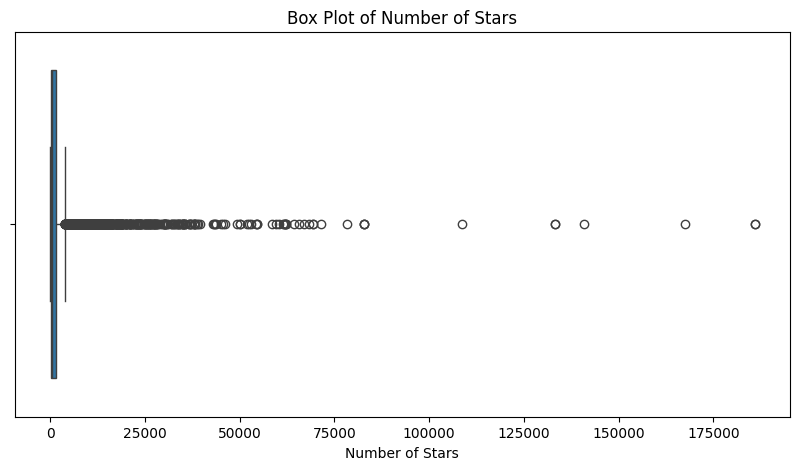

In [26]:
# Check for outliers in 'Number of Stars'
plt.figure(figsize=(10, 5))
sns.boxplot(x=df_cleaned['Number_of_Stars'])
plt.title('Box Plot of Number of Stars')
plt.xlabel('Number of Stars')
plt.show()

c:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


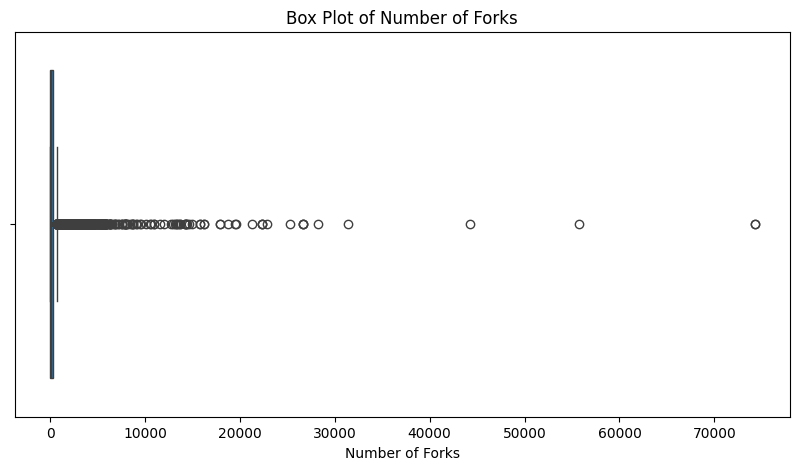

In [27]:
# Check for outliers in 'Number of Forks'
plt.figure(figsize=(10, 5))
sns.boxplot(x=df_cleaned['Number_of_Forks'])
plt.title('Box Plot of Number of Forks')
plt.xlabel('Number of Forks')
plt.show()

c:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


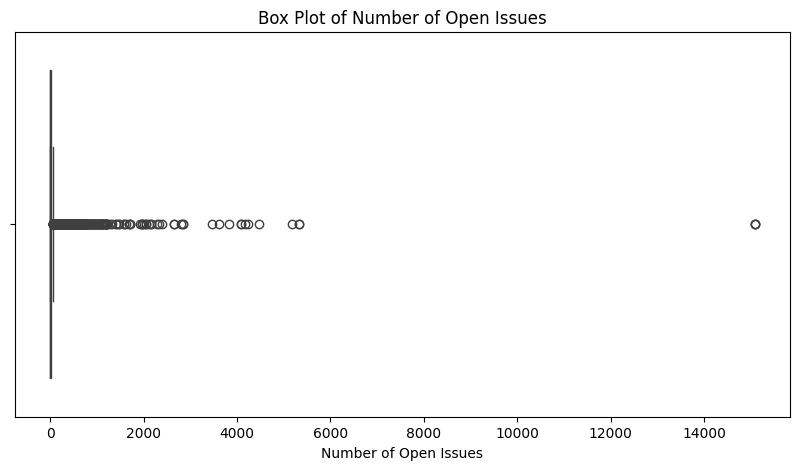

In [28]:
# Check for outliers in 'Number of Open Issues'
plt.figure(figsize=(10, 5))
sns.boxplot(x=df_cleaned['Number_of_Open_Issues'])
plt.title('Box Plot of Number of Open Issues')
plt.xlabel('Number of Open Issues')
plt.show()

In [81]:
import pandas as pd
import numpy as np

# Assume 'df_cleaned' is your DataFrame and 'Number_of_Stars' is the column to check for outliers

# Option 1: Remove outliers
Q1 = df_cleaned['Number_of_Stars'].quantile(0.25)
Q3 = df_cleaned['Number_of_Stars'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers
df_cleaned = df_cleaned[(df_cleaned['Number_of_Stars'] >= lower_bound) & (df_cleaned['Number_of_Stars'] <= upper_bound)]

# Option 2: Cap outliers (uncomment if you prefer this method)
# df_cleaned['Number_of_Stars'] = np.where(df_cleaned['Number_of_Stars'] > upper_bound, upper_bound, df_cleaned['Number_of_Stars'])
# df_cleaned['Number_of_Stars'] = np.where(df_cleaned['Number_of_Stars'] < lower_bound, lower_bound, df_cleaned['Number_of_Stars'])

# Continue with further analysis or modeling...


In [82]:
df_cleaned

,Repository_Name,Owner,Description,URL,Programming_Language,Creation_Date,Last_Updated_Date,Number_of_Stars,Number_of_Forks,Number_of_Open_Issues,License_Type
482,mlfinlab,hudson-and-thames,MlFinLab helps portfolio managers and traders ...,https://github.com/hudson-and-thames/mlfinlab,Data Science,2019-02-13 16:57:25+00:00,2024-10-10 09:44:36+00:00,3941,1146,44,Other
483,machine-learning,udacity,Content for Udacity's Machine Learning curriculum,https://github.com/udacity/machine-learning,Data Science,2016-01-26 18:41:03+00:00,2024-10-07 22:23:47+00:00,3929,6346,0,No License
484,pytorch-forecasting,sktime,Time series forecasting with PyTorch,https://github.com/sktime/pytorch-forecasting,Data Science,2020-07-03 13:05:24+00:00,2024-10-11 07:23:24+00:00,3913,620,507,MIT License
485,statsforecast,Nixtla,Lightning ⚡️ fast forecasting with statistical...,https://github.com/Nixtla/statsforecast,Data Science,2021-11-24 02:19:14+00:00,2024-10-11 00:41:19+00:00,3905,275,100,Apache License 2.0
486,arXivTimes,arXivTimes,repository to research & share the machine lea...,https://github.com/arXivTimes/arXivTimes,Others,2016-10-26 05:27:39+00:00,2024-10-10 09:23:52+00:00,3891,201,2050,MIT License
...,...,...,...,...,...,...,...,...,...,...,...
9995,soft-decision-tree,kimhc6028,"pytorch implementation of ""Distilling a Neural...",https://github.com/kimhc6028/soft-decision-tree,Data Science,2017-12-07 23:31:08+00:00,2024-09-30 07:37:25+00:00,283,59,13,BSD 3-Clause License
9996,CorrectAndSmooth,CUAI,[ICLR 2021] Combining Label Propagation and Si...,https://github.com/CUAI/CorrectAndSmooth,Data Science,2020-10-02 23:46:07+00:00,2024-09-17 15:03:56+00:00,283,52,6,No License
9997,Image-Caption-Generator,dabasajay,A neural network to generate captions for an i...,https://github.com/dabasajay/Image-Caption-Gen...,Data Science,2018-08-10 13:33:49+00:00,2024-09-26 15:40:03+00:00,283,82,16,MIT License
9998,VariationalRecurrentNeuralNetwork,emited,Pytorch implementation of the Variational Recu...,https://github.com/emited/VariationalRecurrent...,Data Science,2017-03-19 15:51:35+00:00,2024-09-13 23:24:07+00:00,282,70,7,No License


In [83]:
import pandas as pd
import numpy as np

# Assume 'df_cleaned' is your DataFrame and 'Number_of_Forks' is the column to check for outliers

# Option 1: Remove outliers
Q1_forks = df_cleaned['Number_of_Forks'].quantile(0.25)
Q3_forks = df_cleaned['Number_of_Forks'].quantile(0.75)
IQR_forks = Q3_forks - Q1_forks
lower_bound_forks = Q1_forks - 1.5 * IQR_forks
upper_bound_forks = Q3_forks + 1.5 * IQR_forks

# Filter out the outliers
df_cleaned = df_cleaned[(df_cleaned['Number_of_Forks'] >= lower_bound_forks) & (df_cleaned['Number_of_Forks'] <= upper_bound_forks)]

# Option 2: Cap outliers (uncomment if you prefer this method)
# df_cleaned['Number_of_Forks'] = np.where(df_cleaned['Number_of_Forks'] > upper_bound_forks, upper_bound_forks, df_cleaned['Number_of_Forks'])
# df_cleaned['Number_of_Forks'] = np.where(df_cleaned['Number_of_Forks'] < lower_bound_forks, lower_bound_forks, df_cleaned['Number_of_Forks'])

# Continue with further analysis or modeling...


In [84]:
import pandas as pd
import numpy as np

# Assume 'df_cleaned' is your DataFrame
# Check for outliers in the 'Number_of_Open_Issues' column

# Option 1: Remove outliers
Q1 = df_cleaned['Number_of_Open_Issues'].quantile(0.25)
Q3 = df_cleaned['Number_of_Open_Issues'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers
df_cleaned = df_cleaned[(df_cleaned['Number_of_Open_Issues'] >= lower_bound) & (df_cleaned['Number_of_Open_Issues'] <= upper_bound)]

# Option 2: Cap outliers (if you prefer not to drop)
# df_cleaned['Number_of_Open_Issues'] = np.where(df_cleaned['Number_of_Open_Issues'] > upper_bound, upper_bound, df_cleaned['Number_of_Open_Issues'])
# df_cleaned['Number_of_Open_Issues'] = np.where(df_cleaned['Number_of_Open_Issues'] < lower_bound, lower_bound, df_cleaned['Number_of_Open_Issues'])

# Continue with further analysis or modeling...


In [85]:
df_cleaned

,Repository_Name,Owner,Description,URL,Programming_Language,Creation_Date,Last_Updated_Date,Number_of_Stars,Number_of_Forks,Number_of_Open_Issues,License_Type
496,turbopilot,ravenscroftj,Turbopilot is an open source large-language-mo...,https://github.com/ravenscroftj/turbopilot,C-Languages,2023-04-09 16:46:33+00:00,2024-10-11 04:04:54+00:00,3826,127,18,BSD 3-Clause License
499,Awesome-Prompt-Engineering,promptslab,This repository contains a hand-curated resour...,https://github.com/promptslab/Awesome-Prompt-E...,Data Science,2023-02-09 18:22:52+00:00,2024-10-10 14:42:47+00:00,3780,341,3,Apache License 2.0
505,olivia,olivia-ai,💁‍♀️Your new best friend powered by an artific...,https://github.com/olivia-ai/olivia,System Programming,2018-06-05 18:19:31+00:00,2024-09-25 13:31:01+00:00,3676,352,27,MIT License
512,projectlearn-project-based-learning,Xtremilicious,A curated list of project tutorials for projec...,https://github.com/Xtremilicious/projectlearn-...,Others,2019-12-01 13:20:52+00:00,2024-10-11 09:51:10+00:00,3600,337,4,MIT License
513,ArtLine,vijishmadhavan,A Deep Learning based project for creating lin...,https://github.com/vijishmadhavan/ArtLine,Data Science,2020-11-23 11:11:19+00:00,2024-10-10 22:32:05+00:00,3592,373,19,MIT License
...,...,...,...,...,...,...,...,...,...,...,...
9995,soft-decision-tree,kimhc6028,"pytorch implementation of ""Distilling a Neural...",https://github.com/kimhc6028/soft-decision-tree,Data Science,2017-12-07 23:31:08+00:00,2024-09-30 07:37:25+00:00,283,59,13,BSD 3-Clause License
9996,CorrectAndSmooth,CUAI,[ICLR 2021] Combining Label Propagation and Si...,https://github.com/CUAI/CorrectAndSmooth,Data Science,2020-10-02 23:46:07+00:00,2024-09-17 15:03:56+00:00,283,52,6,No License
9997,Image-Caption-Generator,dabasajay,A neural network to generate captions for an i...,https://github.com/dabasajay/Image-Caption-Gen...,Data Science,2018-08-10 13:33:49+00:00,2024-09-26 15:40:03+00:00,283,82,16,MIT License
9998,VariationalRecurrentNeuralNetwork,emited,Pytorch implementation of the Variational Recu...,https://github.com/emited/VariationalRecurrent...,Data Science,2017-03-19 15:51:35+00:00,2024-09-13 23:24:07+00:00,282,70,7,No License


In [86]:
# Save the cleaned and transformed data to a new CSV file for future use
df_cleaned.to_csv('github_data_cleaned.csv', index=False)

# 3. Data Storage

In [87]:
#TABLE CREATION
#MYSQL CONNECTION ==> PYTHON CONNECT SQL
pysql_connect=pymysql.connect(host='127.0.0.1',user='root',password='new_password')
cur=pysql_connect.cursor()
cur.execute("create database github_data")

1

In [88]:
# MYSQL CONNECTION ==> PYTHON CONNECT SQL
pysql_connect = pymysql.connect(host='127.0.0.1', user='root', password='new_password')
cur = pysql_connect.cursor()

# Create the 'github_data' database
cur.execute("CREATE DATABASE IF NOT EXISTS github_data")

# Connect to the 'github_data' database
pysql_connect = pymysql.connect(host='127.0.0.1', user='root', password='new_password', database="github_data")
cur = pysql_connect.cursor()

# Create the 'repositories' table with an updated 'Description' column type
sql_create_table = """
CREATE TABLE IF NOT EXISTS repositories(
    id INT AUTO_INCREMENT PRIMARY KEY,
    Repository_Name VARCHAR(255),
    Owner VARCHAR(255),
    Description MEDIUMTEXT,  -- Changed to MEDIUMTEXT
    URL VARCHAR(255),
    Programming_Language VARCHAR(50),
    Creation_Date DATETIME,
    Last_Updated_Date DATETIME,
    Number_of_Stars INT,
    Number_of_Forks INT,
    Number_of_Open_Issues INT,
    License_Type VARCHAR(100)
)
"""
cur.execute(sql_create_table)
pysql_connect.commit()

# Insert data from the DataFrame
sql = """
INSERT INTO repositories (Repository_Name, Owner, Description, URL, Programming_Language, 
Creation_Date, Last_Updated_Date, Number_of_Stars, Number_of_Forks, Number_of_Open_Issues, License_Type)
VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)
"""

# Insert each row from the DataFrame into the database
for i in range(0, len(df_cleaned)):
    cur.execute(sql, tuple(df_cleaned.iloc[i]))
    pysql_connect.commit()

# Close the connection and cursor
cur.close()
pysql_connect.close()


# 4. Exploratory Data Analysis

In [89]:
df_cleaned.columns

Index(['Repository_Name', 'Owner', 'Description', 'URL',
       'Programming_Language', 'Creation_Date', 'Last_Updated_Date',
       'Number_of_Stars', 'Number_of_Forks', 'Number_of_Open_Issues',
       'License_Type'],
      dtype='object')

In [95]:
# Popular Programming Languages
popular_languages = df_cleaned['Programming_Language'].value_counts()
popular_languages


Programming_Language
Data Science              3409
Others                    1067
Web Development            495
C-Languages                270
Java                       243
System Programming         143
Functional Programming     101
Scripting Languages         88
Apple Development           24
Scientific Computing        24
Mobile Development          20
Database                     2
Name: count, dtype: int64

In [96]:
# Repositories with Most Stars
top_repositories_by_stars = df_cleaned[['Repository_Name', 'Number_of_Stars']].sort_values(by='Number_of_Stars', ascending=False).head(10)
top_repositories_by_stars


,Repository_Name,Number_of_Stars
496,turbopilot,3826
2467,Awesome-AIGC-Tutorials,3821
499,Awesome-Prompt-Engineering,3780
1092,britecharts,3743
505,olivia,3676
5176,awesome-computer-science-opportunities,3672
6125,YAYI2,3608
512,projectlearn-project-based-learning,3600
513,ArtLine,3592
2502,web-stable-diffusion,3562


In [97]:
# Repositories with Most Forks
top_repositories_by_forks = df_cleaned[['Repository_Name', 'Number_of_Forks']].sort_values(by='Number_of_Forks', ascending=False).head(10)
top_repositories_by_forks

,Repository_Name,Number_of_Forks
822,Simd,409
7041,feature-engineering-and-feature-selection,408
5477,fin-ml,407
4136,flink-kubernetes-operator,407
5352,DLTK,406
939,oryx,405
5416,Generative_Deep_Learning_2nd_Edition,405
5318,mlr,404
992,AB3DMOT,403
1113,matplotlib-cheatsheet,402


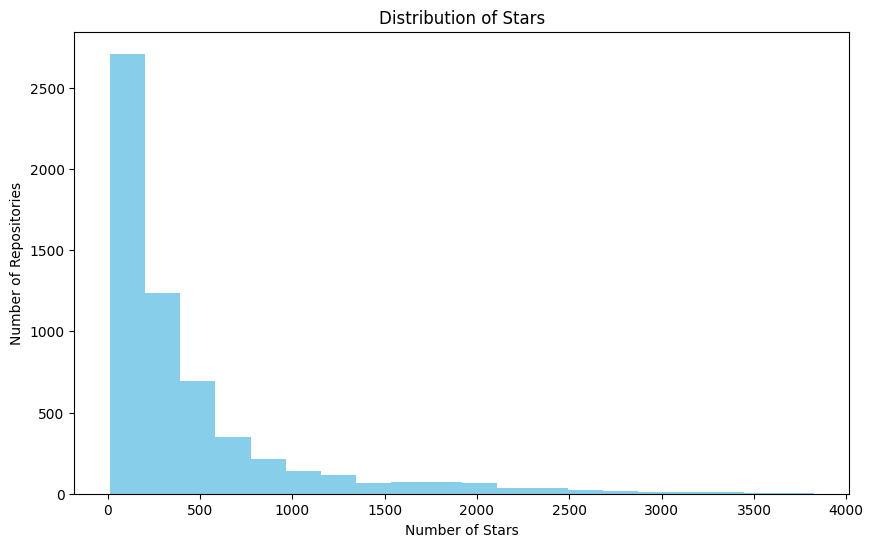

In [100]:
import matplotlib.pyplot as plt

# Plot distribution of stars
plt.figure(figsize=(10, 6))
plt.hist(df_cleaned['Number_of_Stars'], bins=20, color='skyblue')
plt.title('Distribution of Stars')
plt.xlabel('Number of Stars')
plt.ylabel('Number of Repositories')
plt.show()


In [101]:
# Average number of stars per programming language
avg_stars_per_language = df_cleaned.groupby('Programming_Language')['Number_of_Stars'].mean().sort_values(ascending=False)
print(avg_stars_per_language)


Programming_Language
Apple Development         755.875000
System Programming        523.447552
C-Languages               497.437037
Others                    482.858482
Data Science              420.928718
Web Development           410.482828
Scripting Languages       333.329545
Mobile Development        323.450000
Database                  227.000000
Java                      216.950617
Functional Programming    176.346535
Scientific Computing      164.791667
Name: Number_of_Stars, dtype: float64


In [102]:
# Count of repositories by license type
license_counts = df_cleaned['License_Type'].value_counts()
print(license_counts)


License_Type
MIT License                    1875
No License                     1841
Apache License 2.0              982
Other                           431
GNU GPL v3.0                    314
BSD 3-Clause License            136
CC0 1.0 Universal                61
GNU AGPL v3.0                    55
BSD 2-Clause License             42
GNU LGPL v3.0                    31
CC BY 4.0                        26
GNU GPL v2.0                     25
CC BY-SA 4.0                     21
Mozilla Public License 2.0       12
The Unlicense                     8
ISC License                       7
GNU LGPL v2.1                     4
Eclipse Public License v1.0       3
Eclipse Public License v2.0       2
Boost Software License 1.0        2
EU Public License v1.1            2
zlib License                      2
EU Public License v1.2            1
WTFPL                             1
Mulan License v2.0                1
Open Software License v3.0        1
Name: count, dtype: int64


In [35]:
# Convert Last_Updated_Date to datetime format and make it tz-naive
df_cleaned['Last_Updated_Date'] = pd.to_datetime(df_cleaned['Last_Updated_Date']).dt.tz_localize(None)

# Calculate days since last update (pd.Timestamp.now() is tz-aware, so we remove the tz info)
df_cleaned['Days_Since_Last_Update'] = (pd.Timestamp.now().tz_localize(None) - df_cleaned['Last_Updated_Date']).dt.days

# Analyze repositories that haven't been updated in the last year
inactive_repos = df_cleaned[df_cleaned['Days_Since_Last_Update'] > 365]
print(f"Repositories that haven't been updated in over a year: {len(inactive_repos)}")


Repositories that haven't been updated in over a year: 247


In [103]:
# Correlation between stars and forks
correlation = df_cleaned['Number_of_Stars'].corr(df_cleaned['Number_of_Forks'])
print(f"Correlation between stars and forks: {correlation}")


Correlation between stars and forks: 0.68631409304543


In [104]:
# Top 10 repositories by number of open issues
top_open_issues_repos = df_cleaned[['Repository_Name', 'Number_of_Open_Issues']].sort_values(by='Number_of_Open_Issues', ascending=False).head(10)
print(top_open_issues_repos)


             Repository_Name  Number_of_Open_Issues
1214             three-globe                     41
1199        writer-framework                     41
6311             modelfusion                     41
3249         TencentPretrain                     41
1260                     see                     41
4372              Hydrograph                     41
4384                deltacat                     41
6368  cheatsheet-translation                     41
1220                 facette                     41
2525        makegirlsmoe_web                     41


In [105]:
# Convert Creation_Date to datetime format and ensure it's tz-naive
df_cleaned['Creation_Date'] = pd.to_datetime(df_cleaned['Creation_Date']).dt.tz_localize(None)

# Calculate repository age in years
df_cleaned['Repository_Age_Years'] = (pd.Timestamp.now().tz_localize(None) - df_cleaned['Creation_Date']).dt.days / 365

# Average repository age
avg_repo_age = df_cleaned['Repository_Age_Years'].mean()
print(f"Average repository age: {avg_repo_age:.2f} years")


Average repository age: 5.36 years


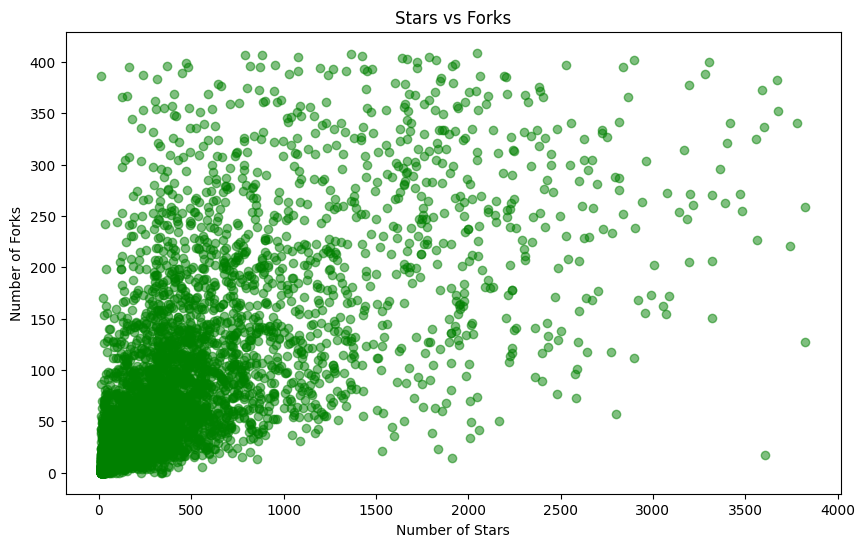

In [106]:
# Scatter plot of stars vs forks
plt.figure(figsize=(10, 6))
plt.scatter(df_cleaned['Number_of_Stars'], df_cleaned['Number_of_Forks'], alpha=0.5, color='green')
plt.title('Stars vs Forks')
plt.xlabel('Number of Stars')
plt.ylabel('Number of Forks')
plt.show()


c:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\categorical.py:632: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


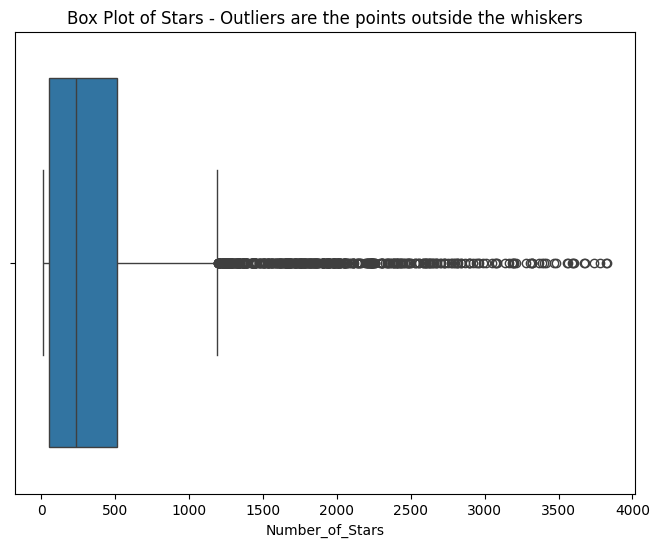

In [108]:


# Box plot for Number of Stars
plt.figure(figsize=(8, 6))
sns.boxplot(x=df_cleaned['Number_of_Stars'])
plt.title('Box Plot of Stars - Outliers are the points outside the whiskers')
plt.show()


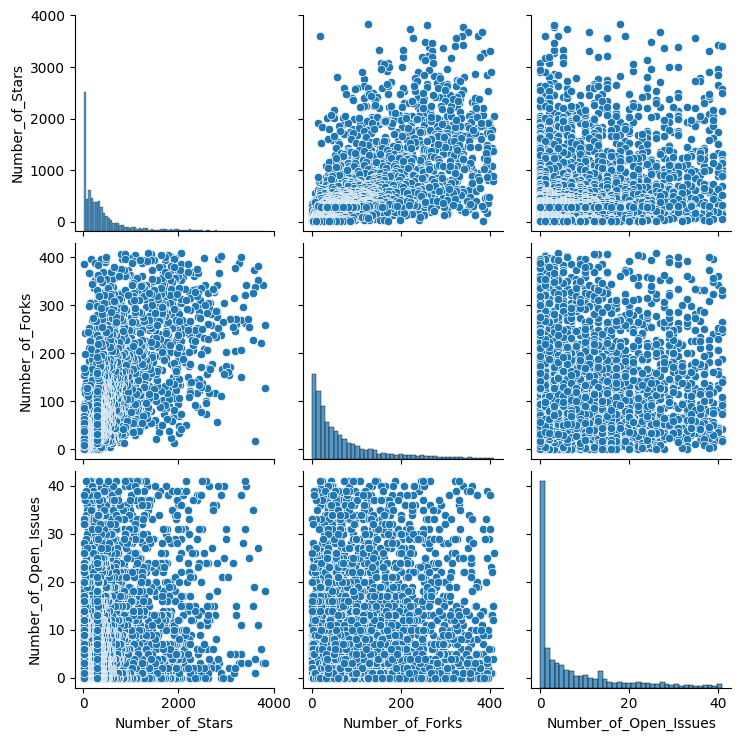

In [109]:
# Pair plot for stars, forks, and open issues
sns.pairplot(df_cleaned[['Number_of_Stars', 'Number_of_Forks', 'Number_of_Open_Issues']])
plt.show()


In [46]:


# Interactive scatter plot for stars vs forks
fig = px.scatter(df_cleaned, x='Number_of_Stars', y='Number_of_Forks', hover_data=['Repository_Name'], title='Stars vs Forks with Interactive Hover')
fig.show()


C:\Users\hp\AppData\Local\Temp\ipykernel_8604\205144065.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_languages.values, y=top_languages.index, palette="viridis")
c:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\seaborn\_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:

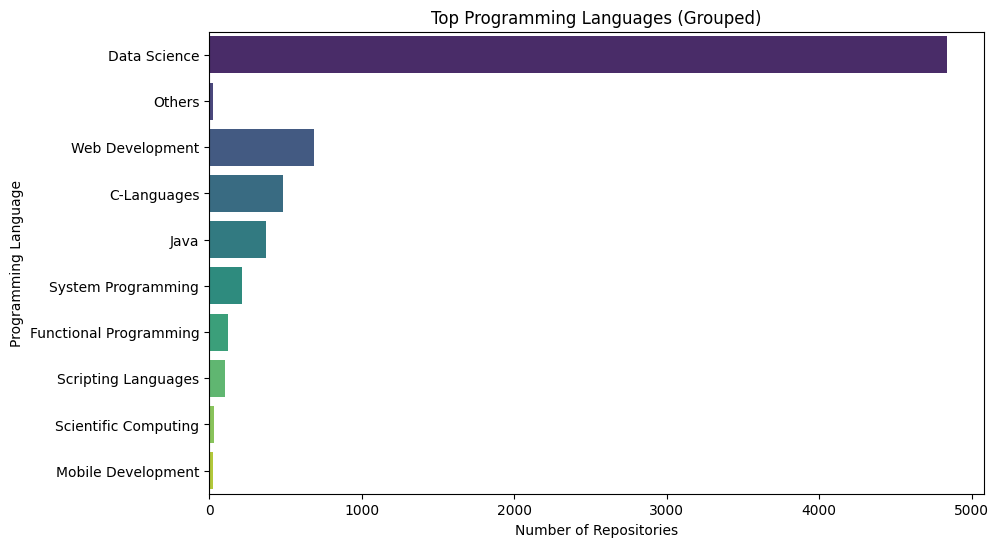

In [110]:

# Count occurrences of each programming language
language_counts = df['Programming_Language'].value_counts()

# Determine the threshold for grouping into 'Others'
# Example: Include top 10 languages, group the rest into 'Others'
threshold = 10
top_languages = language_counts.nlargest(threshold)
other_languages = language_counts.iloc[threshold:].sum()

# Add 'Others' to the top languages
top_languages['Others'] = other_languages

# Plot the top languages
plt.figure(figsize=(10, 6))
sns.barplot(x=top_languages.values, y=top_languages.index, palette="viridis")
plt.title('Top Programming Languages (Grouped)')
plt.xlabel('Number of Repositories')
plt.ylabel('Programming Language')
plt.show()
